# Generating Speech Commands adversarial examples with AdvWaveGAN

In [ ]:
!pip install pydub
!pip install tensorflow-io==0.25.0

!pip install git+https://github.com/tensorflow/docs
!pip install git+https://www.github.com/keras-team/keras-contrib.git

In [ ]:
import os
import time

import matplotlib.pyplot as plt
import numpy as np

import tensorflow as tf
import tensorflow_datasets as tfds
import tensorflow_io as tfio

from callbacks import AudioAdvGANCallback
from losses import carlini_wagner_loss_fn, l2_norm_soft_hinge_loss_fn
from models.advgan import AdvGAN
from models.components import get_wavegan_generator, get_wavegan_discriminator
from models.target import SCConvTarget

from util import (
    images_to_gif,
    generate_adv_examples,
    plot_audio_results,
    plot_confusion_matrix
)

In [ ]:
AUDIO_DIR = 'audio'
WEIGHTS_DIR = 'weights'

BASE_FILENAME = 'advwavegan_sc'

In [ ]:
if not os.path.isdir(AUDIO_DIR):
    os.makedirs(AUDIO_DIR)

if not os.path.isdir(WEIGHTS_DIR):
    os.makedirs(WEIGHTS_DIR)

In [ ]:
TARGET_LABEL = 'up'  # the chosen label for the targeted attack

BATCH_SIZE = 128

INPUT_SHAPE = (8192, 1)
OUTPUT_CHANNELS = 1

LATENT_DIM = 100

In [ ]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-c14f333b-5ed0-8d23-e46a-ded745982bfe)


## Data loading and preprocessing

In [ ]:
(train_data, test_data), info = tfds.load(
    'speech_commands',
    split=['train', 'test'],
    shuffle_files=True,
    as_supervised=True,
    with_info=True,
)

Create a function for filtering out samples labeled as `_silence_`, `_unknown_` or `TARGET_LABEL`:

In [ ]:
labels_to_remove = [
    info.features['label'].str2int('_silence_'),
    info.features['label'].str2int('_unknown_'),
    info.features['label'].str2int(TARGET_LABEL)
]

def label_filter(audio, label):
    return tf.reduce_all(tf.not_equal(label, labels_to_remove))

Create a function for normalizing audio tensors to $[-1.0, 1.0]$:

In [ ]:
def normalize(audio, label):
    return tf.cast(audio, tf.float32) / 32768.0, label

Create a function for resampling audio files from 16 kHZ to 8192 Hz:

In [ ]:
rate_in = 16000
rate_out = INPUT_SHAPE[0]

def resample(audio, label):
    return tfio.audio.resample(audio, rate_in, rate_out), label

Create a function for padding audio tensors with zeroes so that they are all of the same length:

In [ ]:
max_length = rate_out

def pad(audio, label):
    paddings = [[0, max_length - tf.shape(audio)[0]]]
    padded_audio = tf.pad(audio, paddings, 'CONSTANT', constant_values=0)

    return padded_audio, label

Create a function for reshaping audio tensors from `(8192,)` to `(8192, 1)`:

In [ ]:
def reshape(audio, label):
    return audio[..., tf.newaxis], label

Preprocess the datasets:

In [ ]:
def preprocess(dataset):
    return dataset.filter(
        label_filter
    ).map(
        normalize,
        num_parallel_calls=tf.data.AUTOTUNE
    ).map(
        resample,
        num_parallel_calls=tf.data.AUTOTUNE
    ).map(
        pad,
        num_parallel_calls=tf.data.AUTOTUNE
    ).map(
        reshape,
        num_parallel_calls=tf.data.AUTOTUNE
    )

In [ ]:
train_data = preprocess(train_data)
test_data = preprocess(test_data)

Create a function that will be used to transform target model inputs to 2D spectrograms:

In [ ]:
def to_spectrogram(inputs):
    spectrograms = tfio.audio.spectrogram(
        tf.squeeze(inputs, axis=-1),
        nfft=None,
        window=165,
        stride=65
    )

    return tf.expand_dims(spectrograms, axis=-1)

## AdvGAN

[AdvGAN](https://arxiv.org/pdf/1801.02610.pdf) is a generative adversarial network for creating adversarial examples that is based on image-to-image translation models such as [pix2pix](https://openaccess.thecvf.com/content_cvpr_2017/papers/Isola_Image-To-Image_Translation_With_CVPR_2017_paper.pdf) and [CycleGAN](https://openaccess.thecvf.com/content_ICCV_2017/papers/Zhu_Unpaired_Image-To-Image_Translation_ICCV_2017_paper.pdf).

It consists of three parts: the generator, the discriminator, and the target of the adversarial attacks.

The generator creates adversarial perturbations of audio samples, while the discriminator tries to distinguish between original and adversarial audio samples.

The target network is used for computing the adversarial loss, which guides the generator during training towards creating more successful adversarial images.

### _Noise-to-perturbation_ AdvGAN

This is a modified, _noise-to-perturbation_ version of AdvGAN, where perturbations are not created out of images, but out of random noise vectors. This enables it to use DCGAN-based (or WaveGAN-based, for audio) generators and discriminators.

### Generator

The generator is built according to the guidlines in the original [WaveGAN](https://arxiv.org/pdf/1802.04208.pdf) paper. Its architecture is adjusted to work with audio files resampled to 8192 Hz.

In [ ]:
generator = get_wavegan_generator(LATENT_DIM)

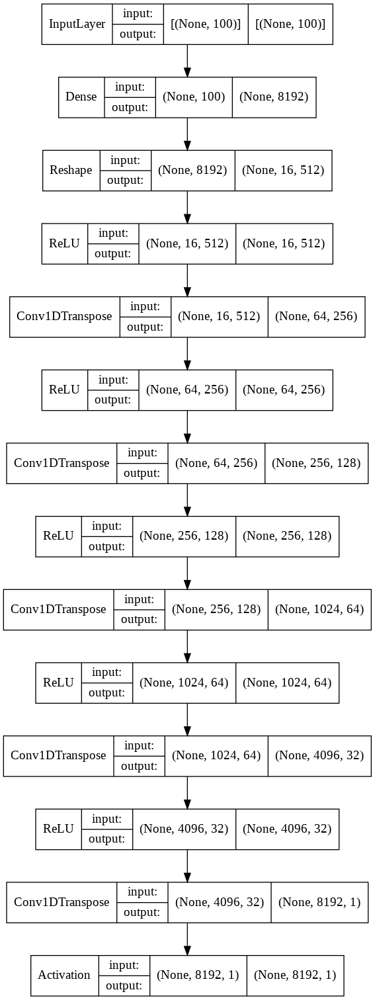

In [ ]:
tf.keras.utils.plot_model(generator, show_shapes=True, show_layer_names=False)

### Discriminator

The discriminator is a CNN-based binary classifier that tries to differentiate between real commands (from the training set) and fake commands (created by the generator). It is also based on the architectures given in the [WaveGAN](https://arxiv.org/pdf/1802.04208.pdf) paper.

In [ ]:
discriminator = get_wavegan_discriminator(INPUT_SHAPE)

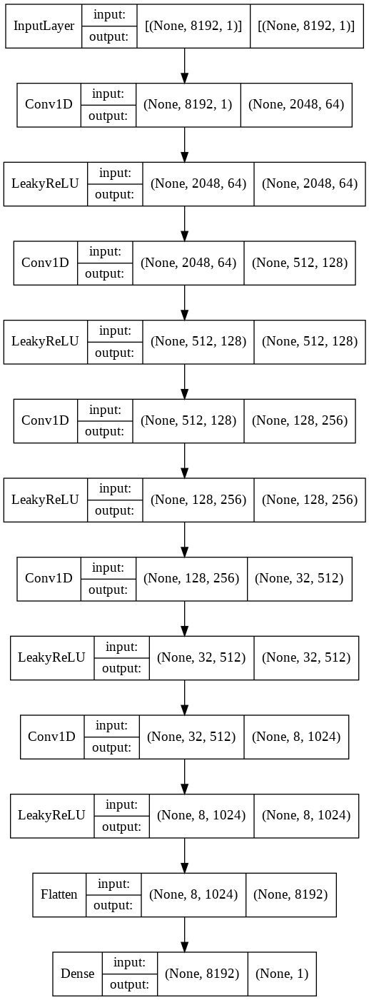

In [ ]:
tf.keras.utils.plot_model(discriminator, show_shapes=True, show_layer_names=False)

### Target

The pre-trained `SCConvTarget` model is the target of the attacks.
It is used for computing the adversarial loss, which guides the generator during training.

In [ ]:
target = SCConvTarget(transform_fn=to_spectrogram)

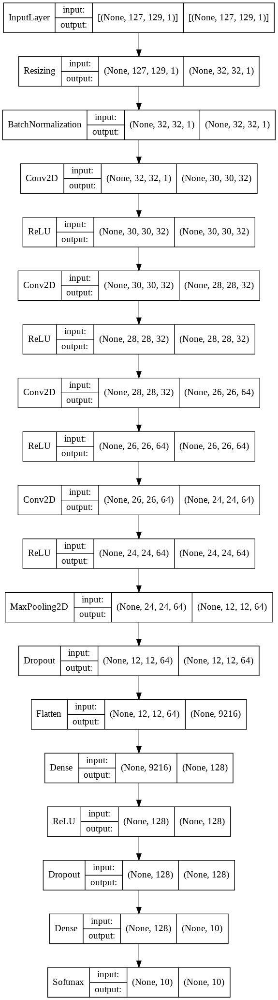

In [ ]:
target.model.build((None, 127, 129, 1))
tf.keras.utils.plot_model(target.model, show_shapes=True, show_layer_names=False)

In [ ]:
weights_path = f'{WEIGHTS_DIR}/speech_commands_target_20220419161057.h5'

target.built = True
target.load_weights(weights_path)

### Training

In each training step, the generator receives a batch of training set images $\mathbf{x}$ as input and uses it to generate a batch of adversarial perturbations $G(\mathbf{x})$.
The adversarial images are obtained by combining the training set images with the perturbations: $\mathbf{x}_{adv} = \mathbf{x} + G(\mathbf{x})$ (making sure that the values remain in $[-1, 1]$).

The target model classifies the adversarial images, and the resulting class probabilities $f(\mathbf{x}_{adv})$ are used for calculating the adversarial loss.

The discriminator is then used to classify real images (from the training set) and adversarial images (produced by the generator).

The loss is calculated for the discriminator and the generator respectively, and the resulting gradients are used to update them.

#### Discriminator loss

The discriminator's loss quantifies how well it distinguishes between real images $\mathbf{x}$ and generated images $\mathbf{x} + G(\mathbf{x})$.
As such, it is a sum of the losses computed on the real and fake outputs:

$\mathcal{L}_D = \mathcal{L_{D,\mathrm{real}}} + \mathcal{L_{D,\mathrm{fake}}}$

For the real component, the discriminator's predictions are compared to an array of 1s, and for the fake outputs to an array of 0s:

$\mathcal{L_{D,\mathrm{real}}} = BCE(\mathbf{1}, D(\mathbf{x}))$

$\mathcal{L_{D,\mathrm{fake}}} = BCE(\mathbf{0}, D(\mathbf{x} + G(\mathbf{x})))$,

where $BCE$ stands for the binary cross-entropy loss function.

#### Generator loss

In the adversarial attack setting, the generator loss $\mathcal{L}_G$, besides quantifying how well the generator fools the discriminator, also needs to quantify the successfulness of the generated adversarial images (i.e. how well do they fool the target into classifying them as the desired target label $t$).

The adversarial component of the loss is calculated according to the formula found in [Carlini and Wagner (2017b)](https://nicholas.carlini.com/papers/2017_sp_nnrobustattacks.pdf).
For a single adversarial image $x_{adv}$ and the corresponding class probabilities obtained from the target model $f(x_{adv})$, the adversarial loss is given as:

$\mathcal{L_{x_{adv}}} = \mathrm{max}(\mathrm{max}_{i \ne t} f(x_{adv})_i - f(x_{adv})_t,\ 0)$

Since we are training on batches of data, the final adversarial loss $\mathcal{L_{adv}}$ is a sum of all the individual adversarial losses for the adversarial images generated in the batch.

Additionally, a soft hinge loss on the L2 norm of the perturbations is added to bound their magnitude. For a single adversarial perturbation:

$\mathcal{L}_{perturb, x} = \mathrm{max}(||G(x)||_2 - \mathrm{bound}, 0)$,

where $\mathrm{bound}$ is a user-specified parameter (e.g. $0.3$).
Again, because we are dealing with batched data, the final perturbation loss $\mathcal{L}_{perturb}$ is a mean of all the individual perturbation losses for the batch.

The total generator loss is then:

$\mathcal{L}_G = \mathcal{L_{adv}} + \lambda_{gan}BCE(\mathbf{1}, D(\mathbf{x} + G(\mathbf{x}))) + \lambda_{perturb}\mathcal{L}_{perturb}$,

where $\lambda_{gan}$ and $\lambda_{perturb}$ are user-defined parameters that control the importance of the original generator loss and perturbation loss respectively.

In [ ]:
train_audio = [audio for audio, _ in train_data]

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices(train_audio).batch(BATCH_SIZE).cache().prefetch(tf.data.AUTOTUNE)

Create the `AdvGAN` model:

In [ ]:
advgan = AdvGAN(
    target=target,
    discriminator=discriminator,
    generator=generator,
    latent_dim=LATENT_DIM
)

Compile the model by adding the respective optimizers (two are needed because the discriminator and generator train seperately), the loss functions, and the $\lambda$ parameters:

Note that `from_logits` needs to be set to `True` as the discriminator outputs logits instead of probabilities.

In [ ]:
PERTURB_BOUND = None

advgan.compile(
    d_optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002),
    g_optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002),

    loss_fn=tf.keras.losses.BinaryCrossentropy(from_logits=True, label_smoothing=0.1),
    adv_loss_fn=carlini_wagner_loss_fn(target_label=info.features['label'].str2int(TARGET_LABEL)),
    perturb_loss_fn=l2_norm_soft_hinge_loss_fn(bound=0.1),

    lambda_gan=1,
    lambda_perturb=1,
    perturb_bound=PERTURB_BOUND,
)

Create a callback that periodically saves generated audio examples:


In [ ]:
sample = tf.data.Dataset.from_tensor_slices(train_audio[:5]).batch(1)

monitor = AudioAdvGANCallback(
    real_audios=sample,
    sample_rate=INPUT_SHAPE[0],
    path_prefix=f'{AUDIO_DIR}/{BASE_FILENAME}',
    latent_dim=LATENT_DIM,
    perturb_bound=PERTURB_BOUND
)

Epoch 1/50
  6/218 [..............................] - ETA: 1:40 - d_loss: 0.6842 - g_loss: 106.4089 - g_gan_loss: 0.7163 - g_adv_loss: 105.0673 - g_perturb_loss: 0.6253WARNING:tensorflow:Callback method `on_train_batch_end` is slow compared to the batch time (batch time: 0.2059s vs `on_train_batch_end` time: 0.2205s). Check your callbacks.


218/218 [==============================] - ETA: 0s - d_loss: 0.2752 - g_loss: 18.9633 - g_gan_loss: 2.9540 - g_adv_loss: 8.1483 - g_perturb_loss: 7.8610

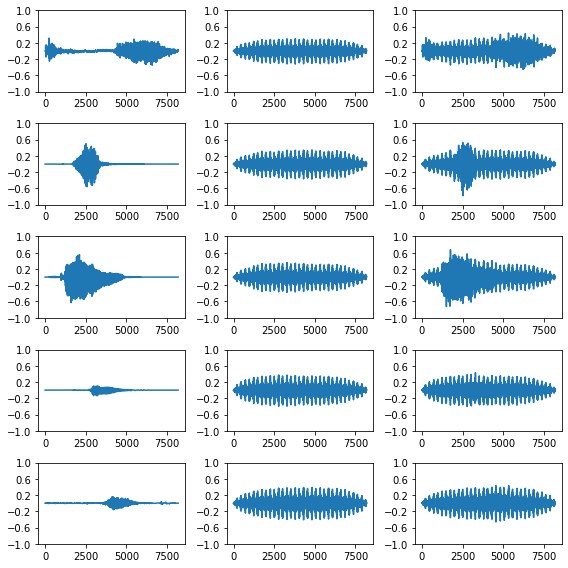

218/218 [==============================] - 124s 491ms/step - d_loss: 0.2748 - g_loss: 18.9323 - g_gan_loss: 2.9533 - g_adv_loss: 8.1187 - g_perturb_loss: 7.8602
Epoch 2/50
218/218 [==============================] - ETA: 0s - d_loss: 0.2044 - g_loss: 12.2708 - g_gan_loss: 2.8409 - g_adv_loss: 2.9322 - g_perturb_loss: 6.4977

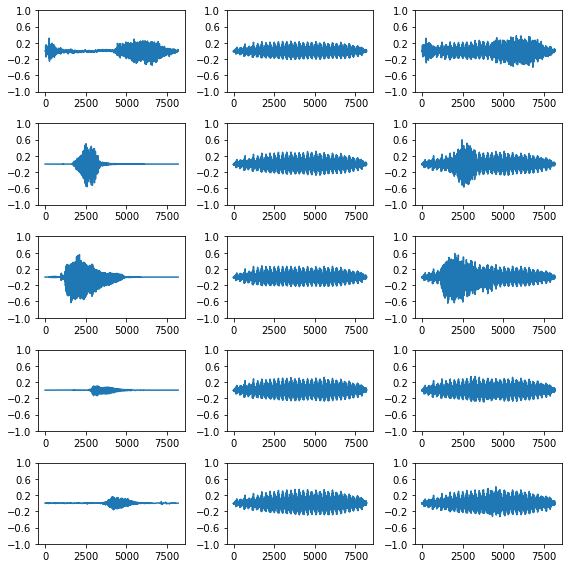

218/218 [==============================] - 106s 486ms/step - d_loss: 0.2044 - g_loss: 12.2645 - g_gan_loss: 2.8402 - g_adv_loss: 2.9253 - g_perturb_loss: 6.4990
Epoch 3/50
218/218 [==============================] - ETA: 0s - d_loss: 0.2017 - g_loss: 11.3249 - g_gan_loss: 2.8354 - g_adv_loss: 2.2957 - g_perturb_loss: 6.1938

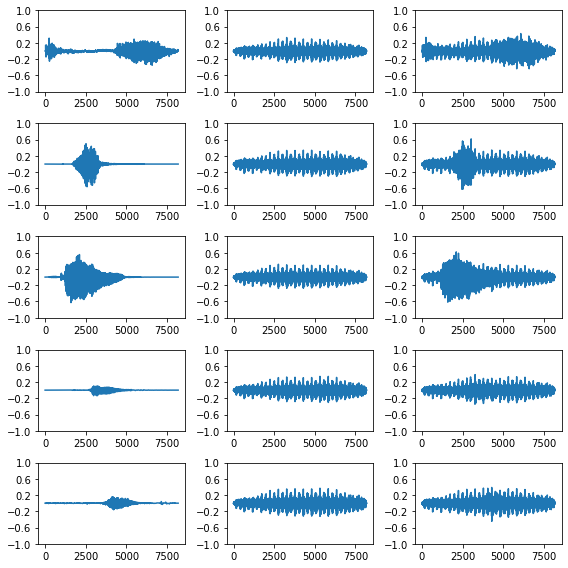

218/218 [==============================] - 106s 486ms/step - d_loss: 0.2017 - g_loss: 11.3208 - g_gan_loss: 2.8347 - g_adv_loss: 2.2921 - g_perturb_loss: 6.1939
Epoch 4/50
218/218 [==============================] - ETA: 0s - d_loss: 0.2007 - g_loss: 11.0480 - g_gan_loss: 2.8484 - g_adv_loss: 2.0343 - g_perturb_loss: 6.1653

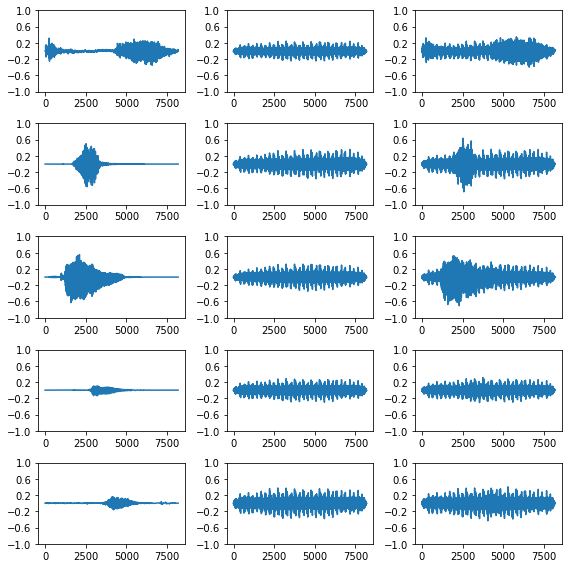

218/218 [==============================] - 106s 487ms/step - d_loss: 0.2007 - g_loss: 11.0449 - g_gan_loss: 2.8478 - g_adv_loss: 2.0310 - g_perturb_loss: 6.1661
Epoch 5/50
218/218 [==============================] - ETA: 0s - d_loss: 0.2008 - g_loss: 10.9399 - g_gan_loss: 2.8502 - g_adv_loss: 2.0867 - g_perturb_loss: 6.0029

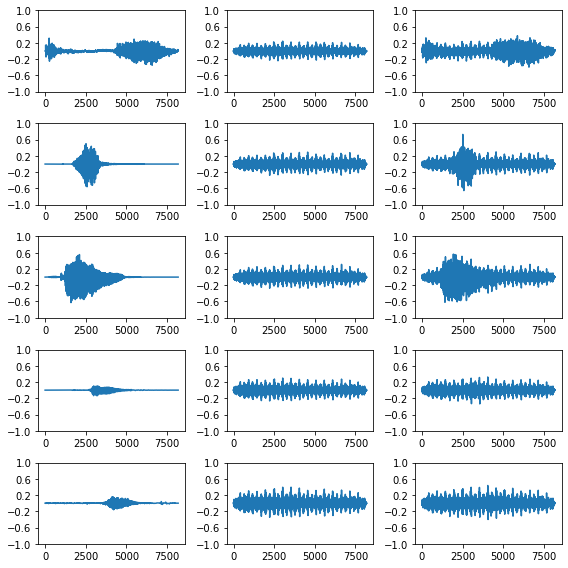

218/218 [==============================] - 106s 486ms/step - d_loss: 0.2008 - g_loss: 10.9341 - g_gan_loss: 2.8505 - g_adv_loss: 2.0830 - g_perturb_loss: 6.0007
Epoch 6/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1999 - g_loss: 10.5556 - g_gan_loss: 2.8517 - g_adv_loss: 2.1478 - g_perturb_loss: 5.5561

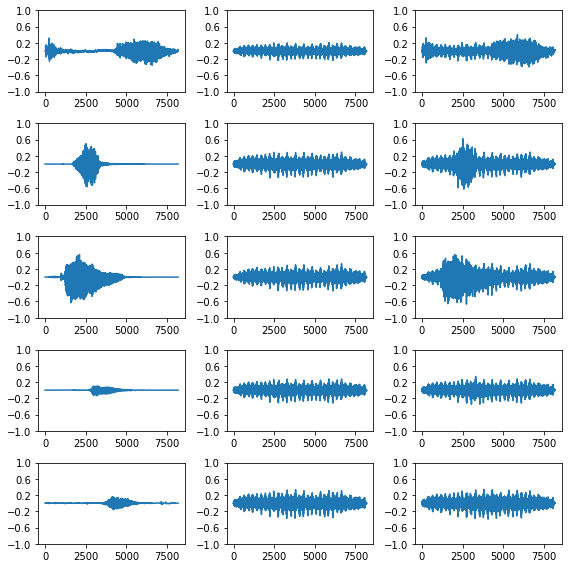

218/218 [==============================] - 106s 486ms/step - d_loss: 0.1999 - g_loss: 10.5514 - g_gan_loss: 2.8511 - g_adv_loss: 2.1440 - g_perturb_loss: 5.5562
Epoch 7/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1997 - g_loss: 10.5623 - g_gan_loss: 2.8437 - g_adv_loss: 2.0520 - g_perturb_loss: 5.6666

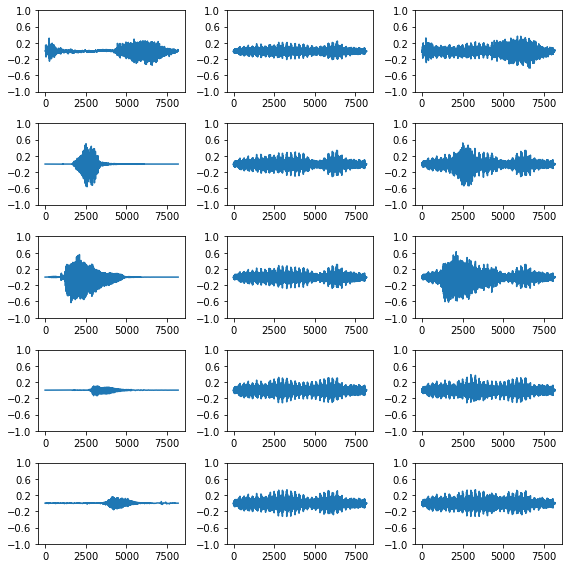

218/218 [==============================] - 106s 488ms/step - d_loss: 0.1996 - g_loss: 10.5573 - g_gan_loss: 2.8430 - g_adv_loss: 2.0472 - g_perturb_loss: 5.6671
Epoch 8/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1999 - g_loss: 9.8293 - g_gan_loss: 2.8494 - g_adv_loss: 2.0725 - g_perturb_loss: 4.9074

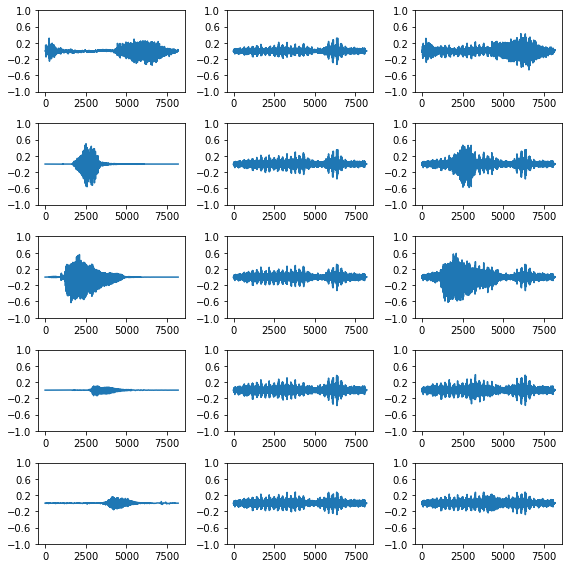

218/218 [==============================] - 106s 487ms/step - d_loss: 0.1999 - g_loss: 9.8221 - g_gan_loss: 2.8500 - g_adv_loss: 2.0676 - g_perturb_loss: 4.9045
Epoch 9/50
218/218 [==============================] - ETA: 0s - d_loss: 0.2009 - g_loss: 8.5778 - g_gan_loss: 2.8428 - g_adv_loss: 1.6274 - g_perturb_loss: 4.1076

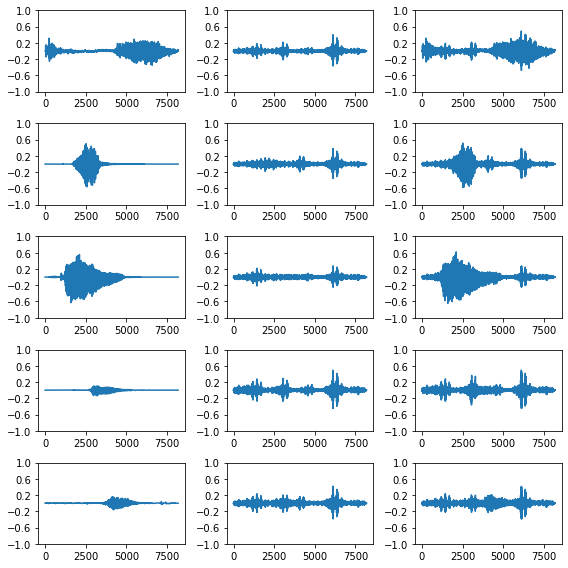

218/218 [==============================] - 106s 485ms/step - d_loss: 0.2009 - g_loss: 8.5704 - g_gan_loss: 2.8416 - g_adv_loss: 1.6245 - g_perturb_loss: 4.1042
Epoch 10/50
218/218 [==============================] - ETA: 0s - d_loss: 0.2029 - g_loss: 7.8870 - g_gan_loss: 2.8407 - g_adv_loss: 1.7241 - g_perturb_loss: 3.3222

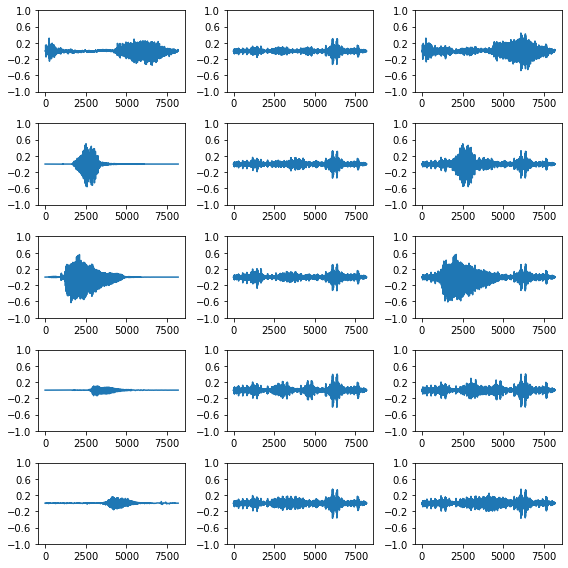

218/218 [==============================] - 106s 486ms/step - d_loss: 0.2029 - g_loss: 7.8868 - g_gan_loss: 2.8414 - g_adv_loss: 1.7200 - g_perturb_loss: 3.3253
Epoch 11/50
218/218 [==============================] - ETA: 0s - d_loss: 0.2014 - g_loss: 7.6480 - g_gan_loss: 2.8375 - g_adv_loss: 1.5281 - g_perturb_loss: 3.2824

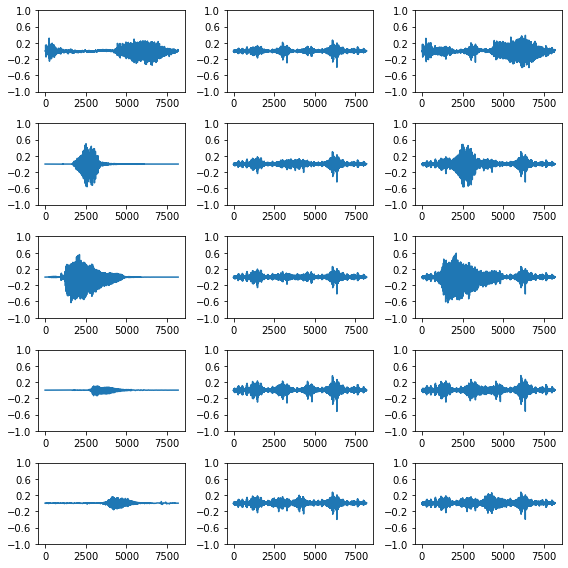

218/218 [==============================] - 106s 486ms/step - d_loss: 0.2014 - g_loss: 7.6486 - g_gan_loss: 2.8369 - g_adv_loss: 1.5277 - g_perturb_loss: 3.2841
Epoch 12/50
218/218 [==============================] - ETA: 0s - d_loss: 0.2028 - g_loss: 7.6111 - g_gan_loss: 2.8423 - g_adv_loss: 1.5976 - g_perturb_loss: 3.1712

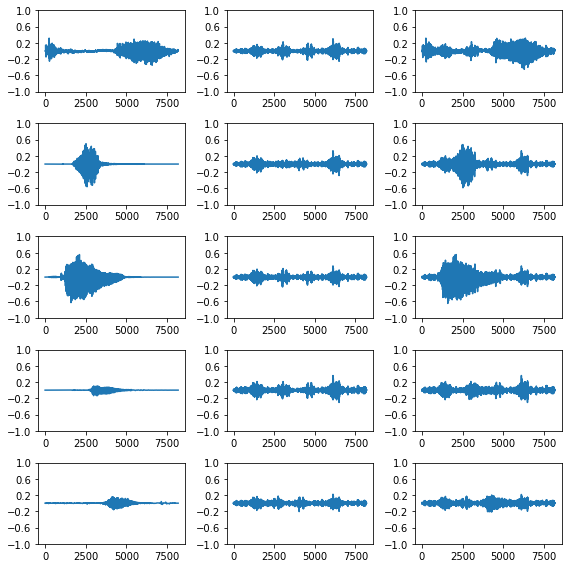

218/218 [==============================] - 106s 487ms/step - d_loss: 0.2028 - g_loss: 7.6057 - g_gan_loss: 2.8425 - g_adv_loss: 1.5904 - g_perturb_loss: 3.1728
Epoch 13/50
218/218 [==============================] - ETA: 0s - d_loss: 0.2004 - g_loss: 7.5189 - g_gan_loss: 2.8472 - g_adv_loss: 1.2977 - g_perturb_loss: 3.3740

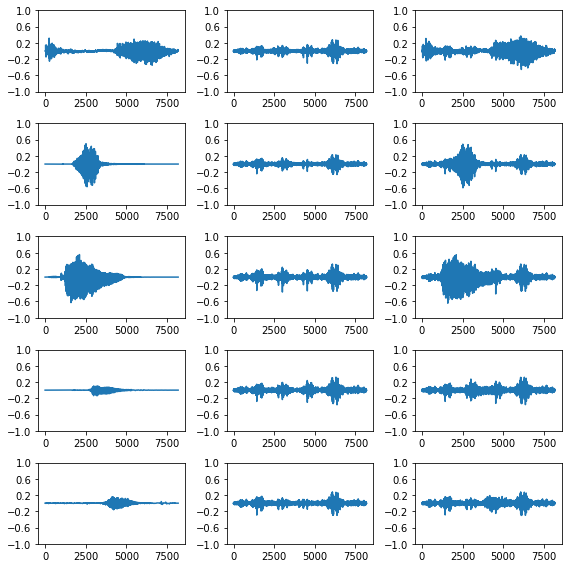

218/218 [==============================] - 106s 488ms/step - d_loss: 0.2004 - g_loss: 7.5147 - g_gan_loss: 2.8479 - g_adv_loss: 1.2920 - g_perturb_loss: 3.3748
Epoch 14/50
218/218 [==============================] - ETA: 0s - d_loss: 0.2006 - g_loss: 7.4978 - g_gan_loss: 2.8461 - g_adv_loss: 1.3808 - g_perturb_loss: 3.2709

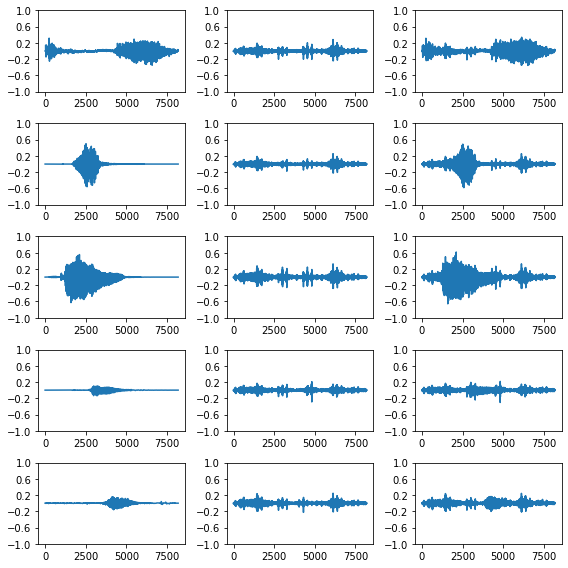

218/218 [==============================] - 106s 486ms/step - d_loss: 0.2006 - g_loss: 7.4933 - g_gan_loss: 2.8462 - g_adv_loss: 1.3784 - g_perturb_loss: 3.2687
Epoch 15/50
218/218 [==============================] - ETA: 0s - d_loss: 0.2005 - g_loss: 7.2954 - g_gan_loss: 2.8453 - g_adv_loss: 1.3953 - g_perturb_loss: 3.0549

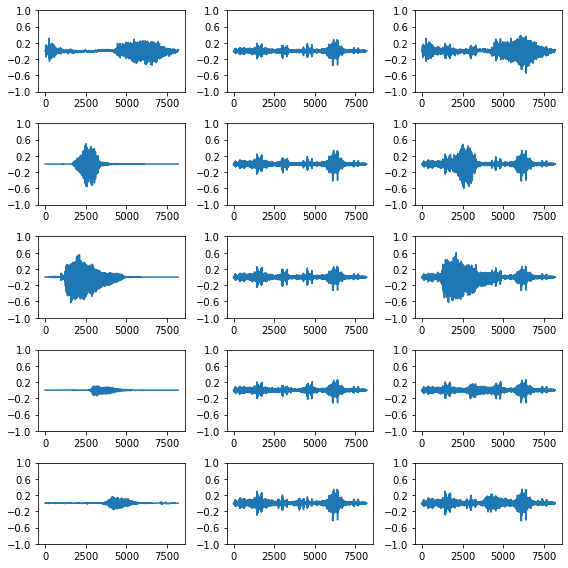

218/218 [==============================] - 105s 480ms/step - d_loss: 0.2005 - g_loss: 7.2908 - g_gan_loss: 2.8452 - g_adv_loss: 1.3889 - g_perturb_loss: 3.0567
Epoch 16/50
218/218 [==============================] - ETA: 0s - d_loss: 0.2002 - g_loss: 7.3012 - g_gan_loss: 2.8467 - g_adv_loss: 1.3775 - g_perturb_loss: 3.0771

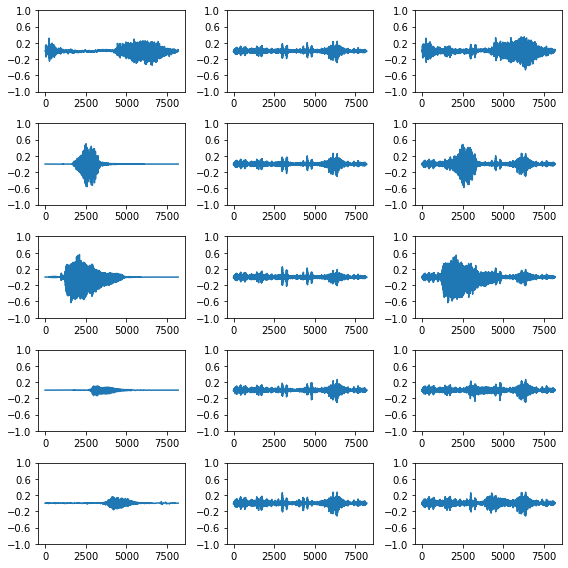

218/218 [==============================] - 106s 484ms/step - d_loss: 0.2002 - g_loss: 7.2954 - g_gan_loss: 2.8469 - g_adv_loss: 1.3712 - g_perturb_loss: 3.0773
Epoch 17/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1997 - g_loss: 7.1629 - g_gan_loss: 2.8482 - g_adv_loss: 1.2521 - g_perturb_loss: 3.0626

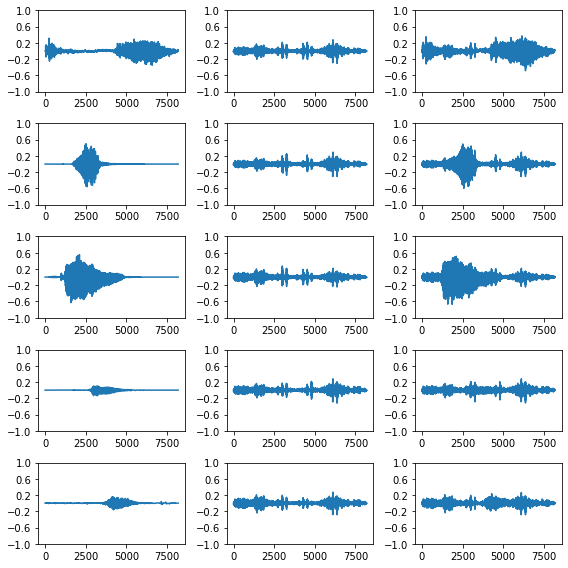

218/218 [==============================] - 104s 478ms/step - d_loss: 0.1997 - g_loss: 7.1590 - g_gan_loss: 2.8478 - g_adv_loss: 1.2464 - g_perturb_loss: 3.0649
Epoch 18/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1997 - g_loss: 7.1695 - g_gan_loss: 2.8506 - g_adv_loss: 1.2603 - g_perturb_loss: 3.0586

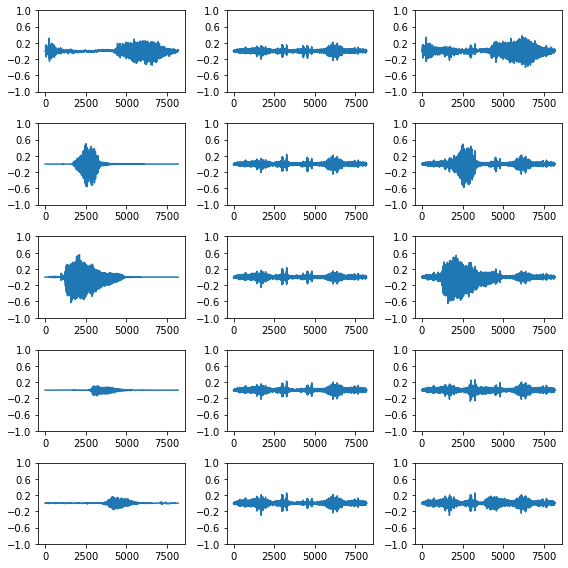

218/218 [==============================] - 106s 485ms/step - d_loss: 0.1997 - g_loss: 7.1639 - g_gan_loss: 2.8509 - g_adv_loss: 1.2546 - g_perturb_loss: 3.0584
Epoch 19/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1994 - g_loss: 7.1591 - g_gan_loss: 2.8484 - g_adv_loss: 1.2107 - g_perturb_loss: 3.1000

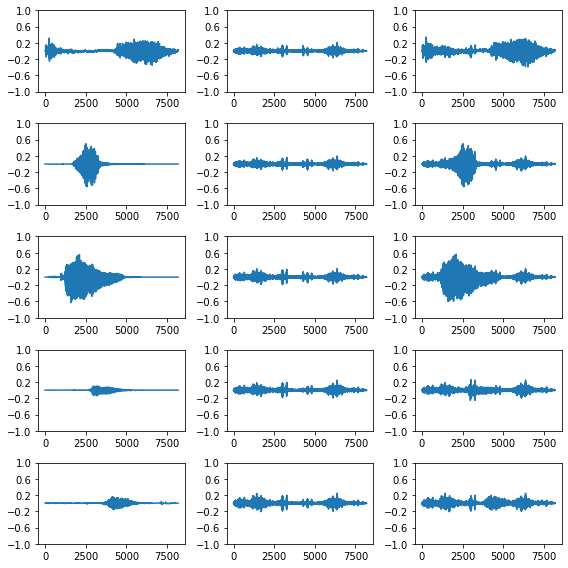

218/218 [==============================] - 106s 486ms/step - d_loss: 0.1994 - g_loss: 7.1549 - g_gan_loss: 2.8481 - g_adv_loss: 1.2089 - g_perturb_loss: 3.0979
Epoch 20/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1992 - g_loss: 6.7982 - g_gan_loss: 2.8486 - g_adv_loss: 0.9930 - g_perturb_loss: 2.9566

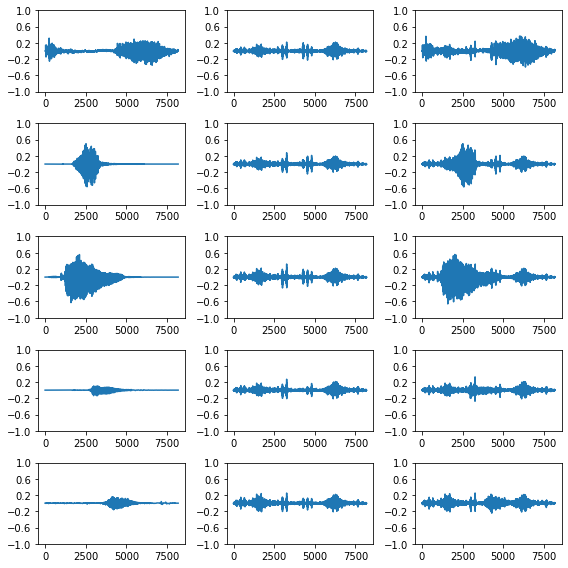

218/218 [==============================] - 106s 485ms/step - d_loss: 0.1992 - g_loss: 6.7947 - g_gan_loss: 2.8486 - g_adv_loss: 0.9885 - g_perturb_loss: 2.9576
Epoch 21/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1991 - g_loss: 6.6374 - g_gan_loss: 2.8486 - g_adv_loss: 1.1268 - g_perturb_loss: 2.6619

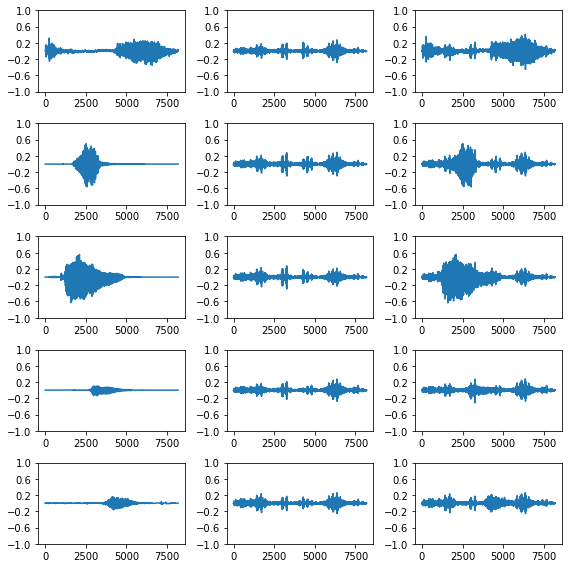

218/218 [==============================] - 106s 486ms/step - d_loss: 0.1991 - g_loss: 6.6343 - g_gan_loss: 2.8487 - g_adv_loss: 1.1217 - g_perturb_loss: 2.6640
Epoch 22/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1990 - g_loss: 6.8463 - g_gan_loss: 2.8492 - g_adv_loss: 1.1015 - g_perturb_loss: 2.8955

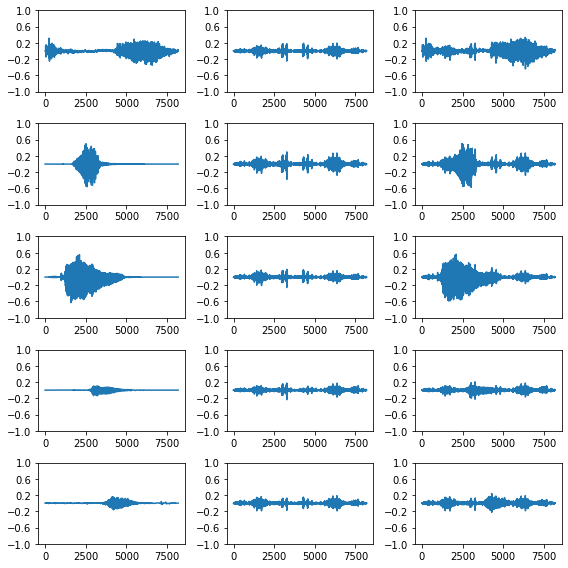

218/218 [==============================] - 106s 487ms/step - d_loss: 0.1990 - g_loss: 6.8401 - g_gan_loss: 2.8493 - g_adv_loss: 1.0965 - g_perturb_loss: 2.8943
Epoch 23/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1992 - g_loss: 6.5934 - g_gan_loss: 2.8486 - g_adv_loss: 1.0205 - g_perturb_loss: 2.7244

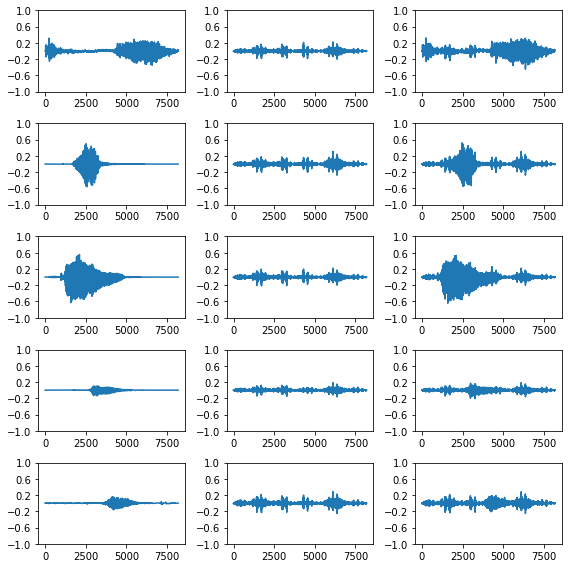

218/218 [==============================] - 106s 486ms/step - d_loss: 0.1992 - g_loss: 6.5881 - g_gan_loss: 2.8489 - g_adv_loss: 1.0158 - g_perturb_loss: 2.7234
Epoch 24/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1991 - g_loss: 6.4669 - g_gan_loss: 2.8485 - g_adv_loss: 0.9741 - g_perturb_loss: 2.6442

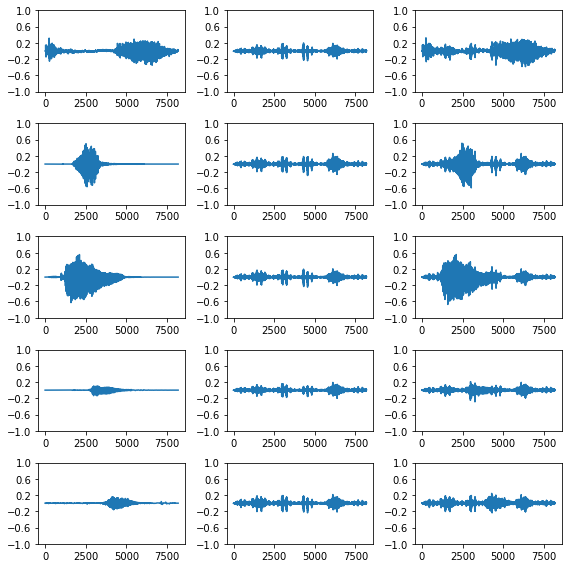

218/218 [==============================] - 105s 481ms/step - d_loss: 0.1991 - g_loss: 6.4624 - g_gan_loss: 2.8486 - g_adv_loss: 0.9697 - g_perturb_loss: 2.6442
Epoch 25/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1988 - g_loss: 6.5100 - g_gan_loss: 2.8496 - g_adv_loss: 0.9771 - g_perturb_loss: 2.6832

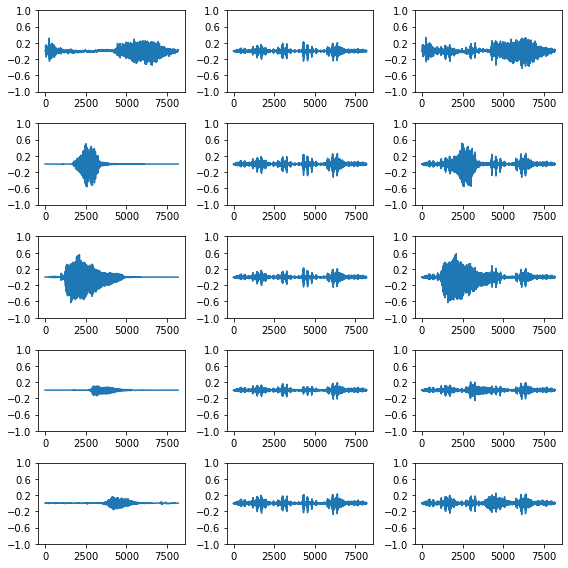

218/218 [==============================] - 104s 476ms/step - d_loss: 0.1988 - g_loss: 6.5074 - g_gan_loss: 2.8497 - g_adv_loss: 0.9751 - g_perturb_loss: 2.6826
Epoch 26/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1989 - g_loss: 6.2868 - g_gan_loss: 2.8487 - g_adv_loss: 0.9687 - g_perturb_loss: 2.4694

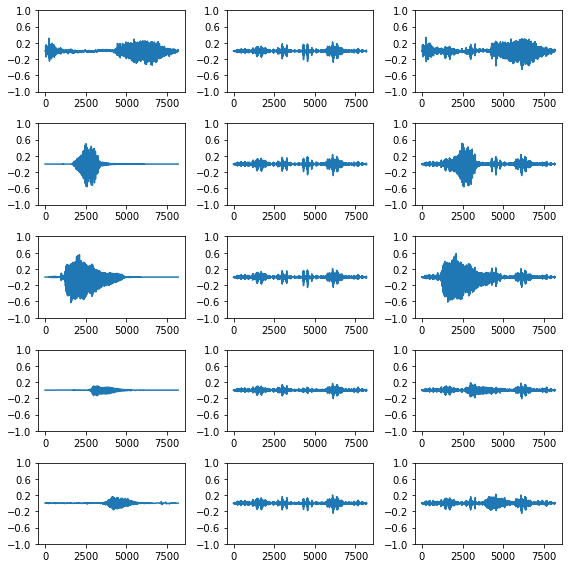

218/218 [==============================] - 106s 484ms/step - d_loss: 0.1989 - g_loss: 6.2812 - g_gan_loss: 2.8484 - g_adv_loss: 0.9643 - g_perturb_loss: 2.4685
Epoch 27/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1990 - g_loss: 6.3573 - g_gan_loss: 2.8484 - g_adv_loss: 0.9760 - g_perturb_loss: 2.5329

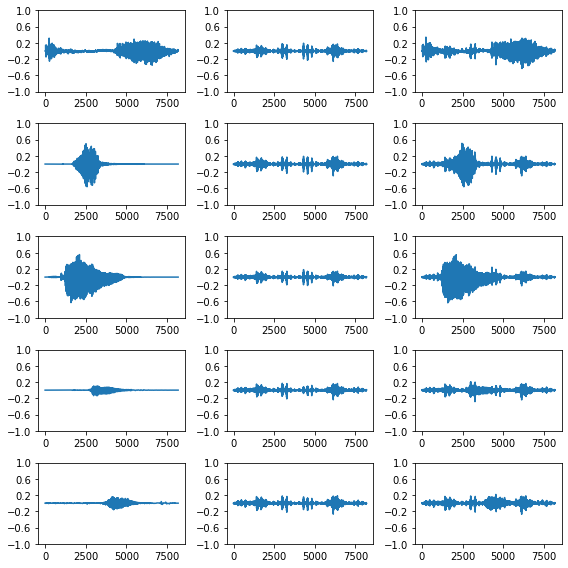

218/218 [==============================] - 104s 477ms/step - d_loss: 0.1990 - g_loss: 6.3515 - g_gan_loss: 2.8480 - g_adv_loss: 0.9716 - g_perturb_loss: 2.5319
Epoch 28/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1989 - g_loss: 6.3515 - g_gan_loss: 2.8503 - g_adv_loss: 1.0887 - g_perturb_loss: 2.4125

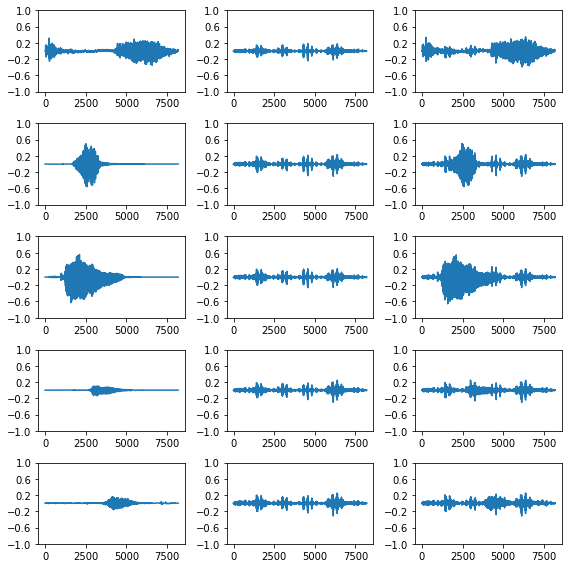

218/218 [==============================] - 104s 475ms/step - d_loss: 0.1989 - g_loss: 6.3470 - g_gan_loss: 2.8505 - g_adv_loss: 1.0838 - g_perturb_loss: 2.4127
Epoch 29/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1988 - g_loss: 6.1965 - g_gan_loss: 2.8490 - g_adv_loss: 0.9603 - g_perturb_loss: 2.3872

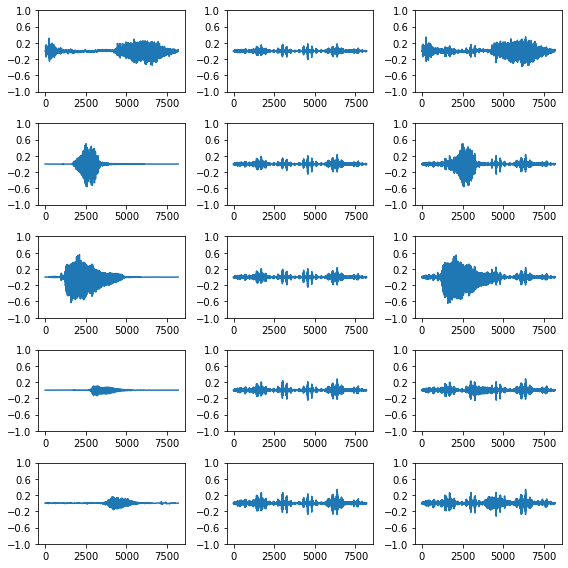

218/218 [==============================] - 104s 476ms/step - d_loss: 0.1988 - g_loss: 6.1922 - g_gan_loss: 2.8491 - g_adv_loss: 0.9559 - g_perturb_loss: 2.3871
Epoch 30/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1989 - g_loss: 6.2068 - g_gan_loss: 2.8493 - g_adv_loss: 0.9003 - g_perturb_loss: 2.4572

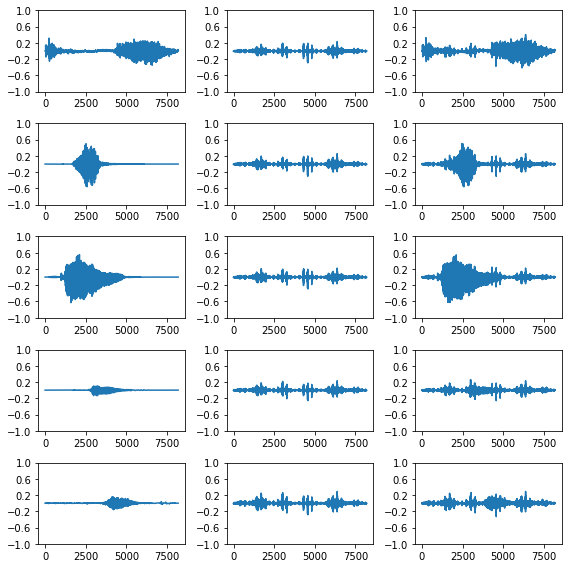

218/218 [==============================] - 105s 482ms/step - d_loss: 0.1989 - g_loss: 6.2015 - g_gan_loss: 2.8493 - g_adv_loss: 0.8962 - g_perturb_loss: 2.4560
Epoch 31/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1988 - g_loss: 6.1503 - g_gan_loss: 2.8493 - g_adv_loss: 0.9390 - g_perturb_loss: 2.3621

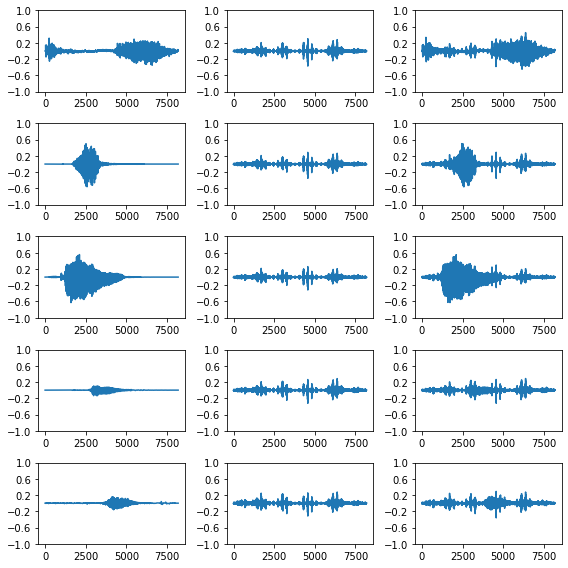

218/218 [==============================] - 106s 486ms/step - d_loss: 0.1988 - g_loss: 6.1461 - g_gan_loss: 2.8493 - g_adv_loss: 0.9347 - g_perturb_loss: 2.3621
Epoch 32/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1989 - g_loss: 6.1548 - g_gan_loss: 2.8490 - g_adv_loss: 0.8753 - g_perturb_loss: 2.4305

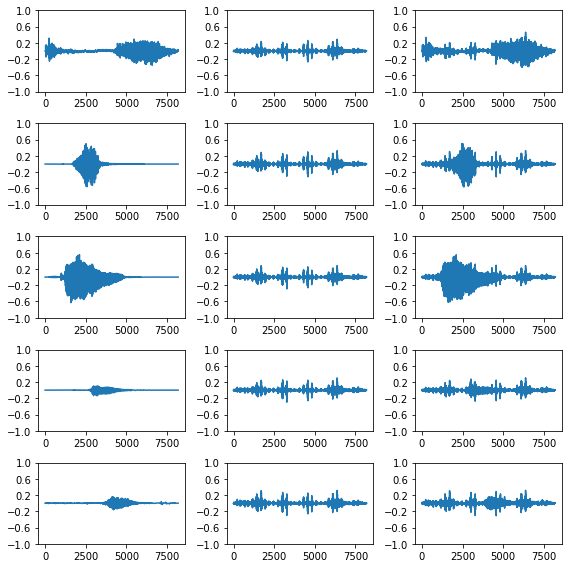

218/218 [==============================] - 106s 485ms/step - d_loss: 0.1989 - g_loss: 6.1506 - g_gan_loss: 2.8488 - g_adv_loss: 0.8713 - g_perturb_loss: 2.4305
Epoch 33/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 6.1377 - g_gan_loss: 2.8491 - g_adv_loss: 0.9061 - g_perturb_loss: 2.3824

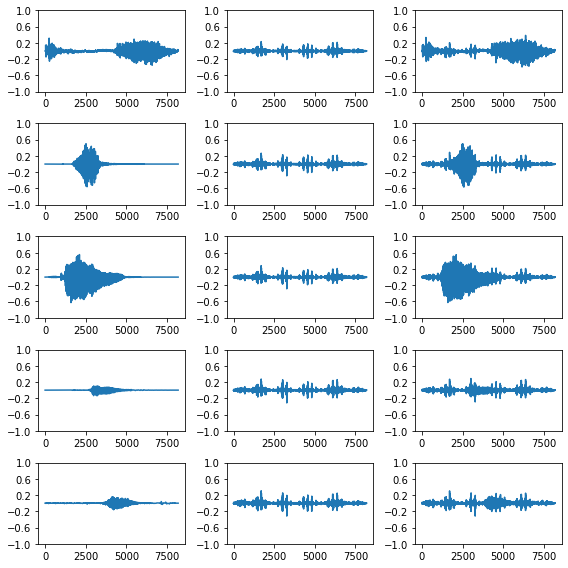

218/218 [==============================] - 104s 477ms/step - d_loss: 0.1987 - g_loss: 6.1334 - g_gan_loss: 2.8492 - g_adv_loss: 0.9020 - g_perturb_loss: 2.3822
Epoch 34/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 6.1391 - g_gan_loss: 2.8487 - g_adv_loss: 0.8250 - g_perturb_loss: 2.4653

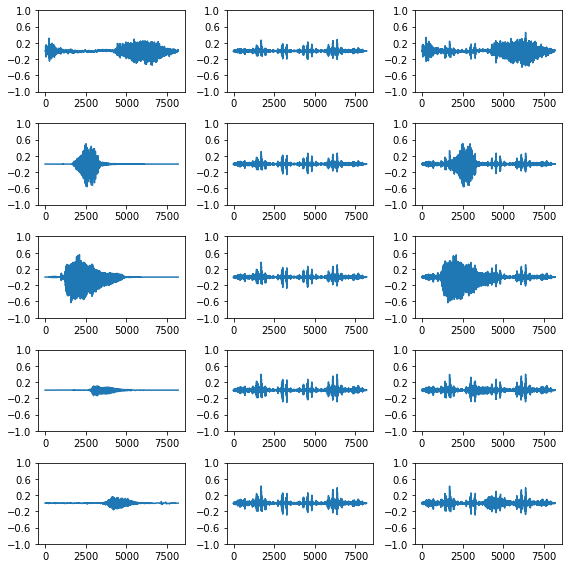

218/218 [==============================] - 105s 483ms/step - d_loss: 0.1987 - g_loss: 6.1361 - g_gan_loss: 2.8485 - g_adv_loss: 0.8212 - g_perturb_loss: 2.4663
Epoch 35/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 6.1051 - g_gan_loss: 2.8492 - g_adv_loss: 0.8313 - g_perturb_loss: 2.4245

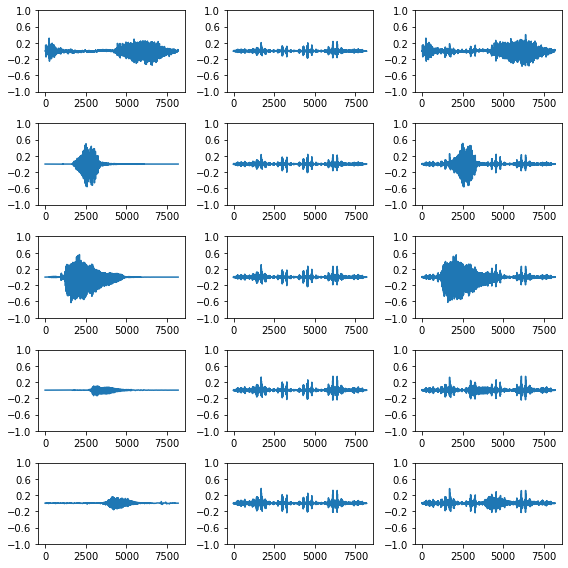

218/218 [==============================] - 106s 486ms/step - d_loss: 0.1987 - g_loss: 6.1005 - g_gan_loss: 2.8494 - g_adv_loss: 0.8275 - g_perturb_loss: 2.4236
Epoch 36/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1988 - g_loss: 6.1462 - g_gan_loss: 2.8496 - g_adv_loss: 0.9348 - g_perturb_loss: 2.3619

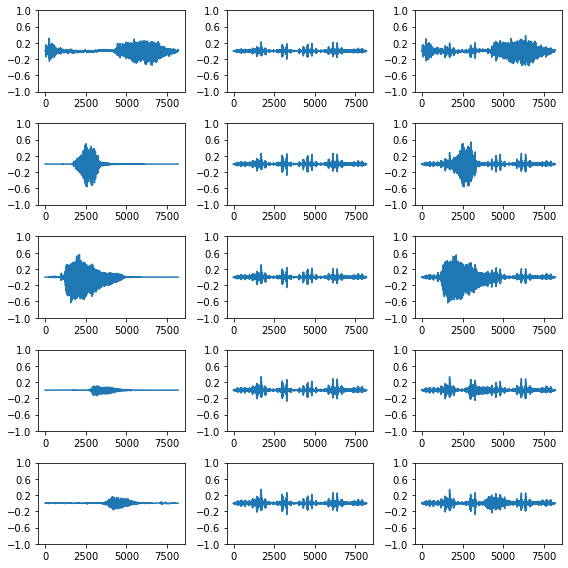

218/218 [==============================] - 104s 477ms/step - d_loss: 0.1988 - g_loss: 6.1430 - g_gan_loss: 2.8500 - g_adv_loss: 0.9305 - g_perturb_loss: 2.3626
Epoch 37/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 6.0933 - g_gan_loss: 2.8489 - g_adv_loss: 0.9254 - g_perturb_loss: 2.3190

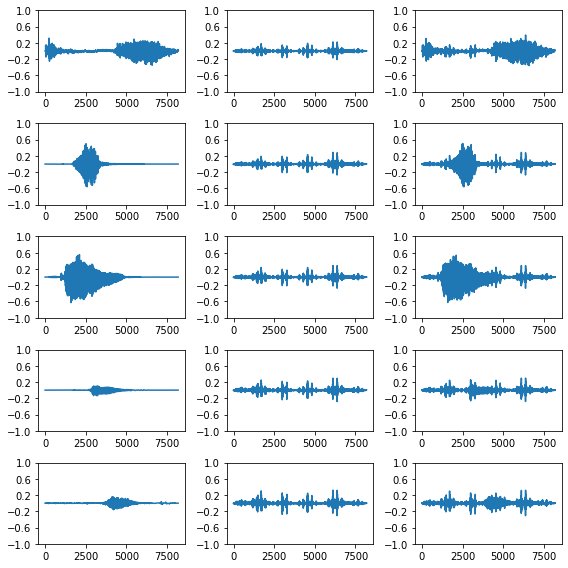

218/218 [==============================] - 105s 483ms/step - d_loss: 0.1987 - g_loss: 6.0883 - g_gan_loss: 2.8489 - g_adv_loss: 0.9212 - g_perturb_loss: 2.3182
Epoch 38/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 6.0082 - g_gan_loss: 2.8487 - g_adv_loss: 0.9100 - g_perturb_loss: 2.2494

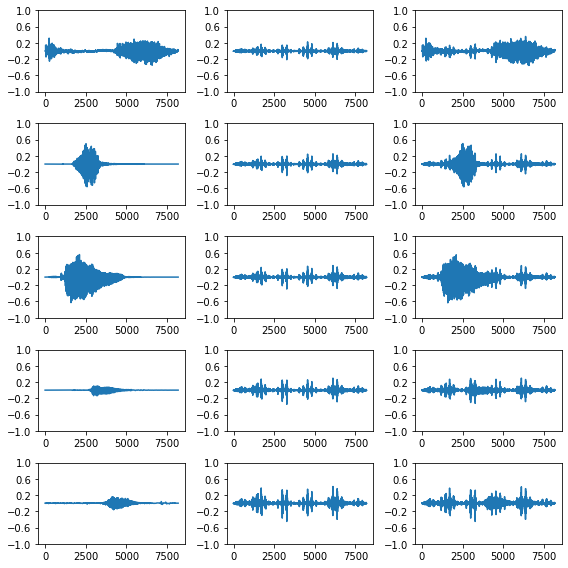

218/218 [==============================] - 106s 485ms/step - d_loss: 0.1987 - g_loss: 6.0047 - g_gan_loss: 2.8486 - g_adv_loss: 0.9059 - g_perturb_loss: 2.2502
Epoch 39/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 6.0416 - g_gan_loss: 2.8484 - g_adv_loss: 0.8179 - g_perturb_loss: 2.3754

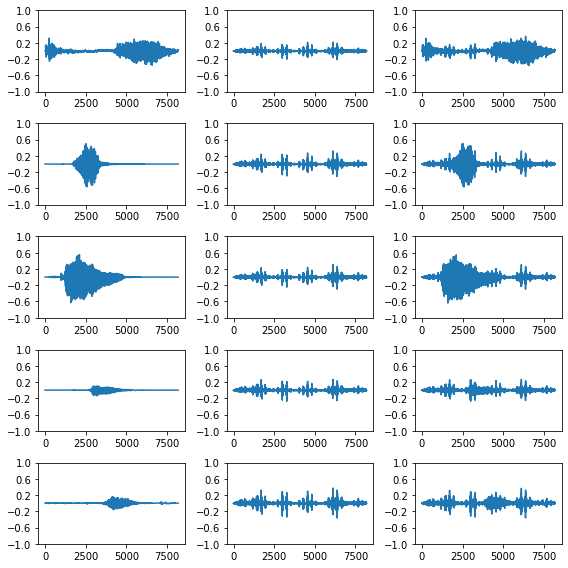

218/218 [==============================] - 106s 485ms/step - d_loss: 0.1986 - g_loss: 6.0383 - g_gan_loss: 2.8481 - g_adv_loss: 0.8142 - g_perturb_loss: 2.3760
Epoch 40/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 6.0272 - g_gan_loss: 2.8488 - g_adv_loss: 0.8178 - g_perturb_loss: 2.3607

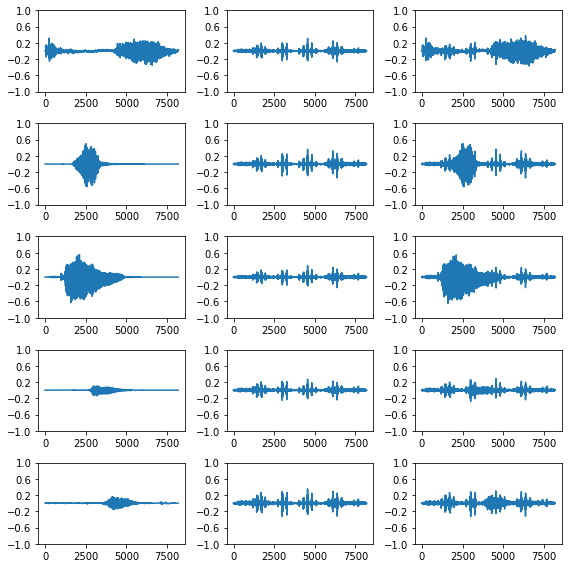

218/218 [==============================] - 104s 478ms/step - d_loss: 0.1987 - g_loss: 6.0233 - g_gan_loss: 2.8487 - g_adv_loss: 0.8141 - g_perturb_loss: 2.3605
Epoch 41/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 6.0399 - g_gan_loss: 2.8490 - g_adv_loss: 0.8476 - g_perturb_loss: 2.3434

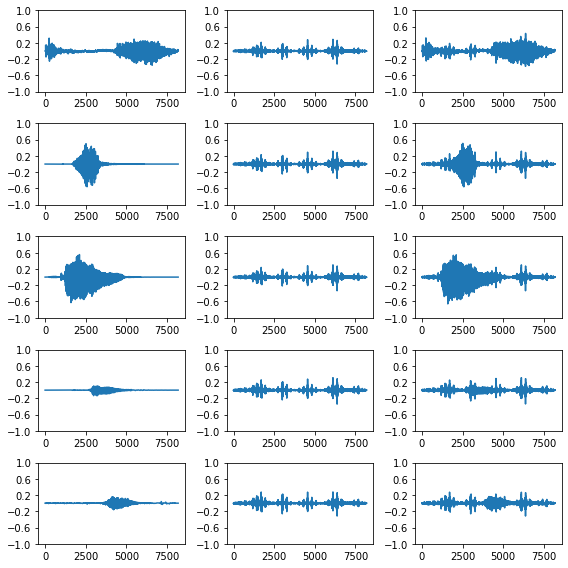

218/218 [==============================] - 105s 483ms/step - d_loss: 0.1986 - g_loss: 6.0360 - g_gan_loss: 2.8488 - g_adv_loss: 0.8437 - g_perturb_loss: 2.3435
Epoch 42/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 6.0030 - g_gan_loss: 2.8492 - g_adv_loss: 0.8953 - g_perturb_loss: 2.2586

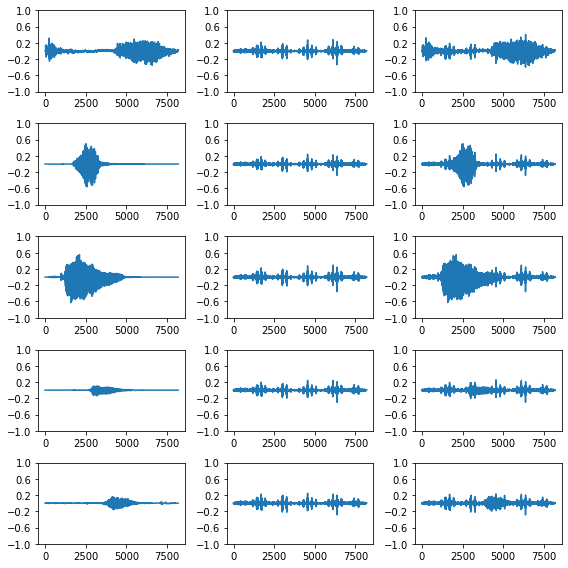

218/218 [==============================] - 106s 484ms/step - d_loss: 0.1987 - g_loss: 5.9981 - g_gan_loss: 2.8492 - g_adv_loss: 0.8912 - g_perturb_loss: 2.2578
Epoch 43/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1988 - g_loss: 5.9472 - g_gan_loss: 2.8491 - g_adv_loss: 0.9290 - g_perturb_loss: 2.1692

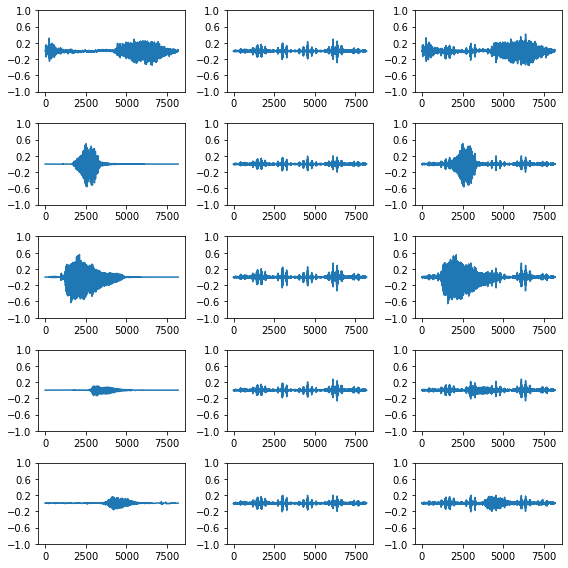

218/218 [==============================] - 106s 485ms/step - d_loss: 0.1988 - g_loss: 5.9422 - g_gan_loss: 2.8488 - g_adv_loss: 0.9247 - g_perturb_loss: 2.1687
Epoch 44/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 5.9831 - g_gan_loss: 2.8494 - g_adv_loss: 0.8343 - g_perturb_loss: 2.2994

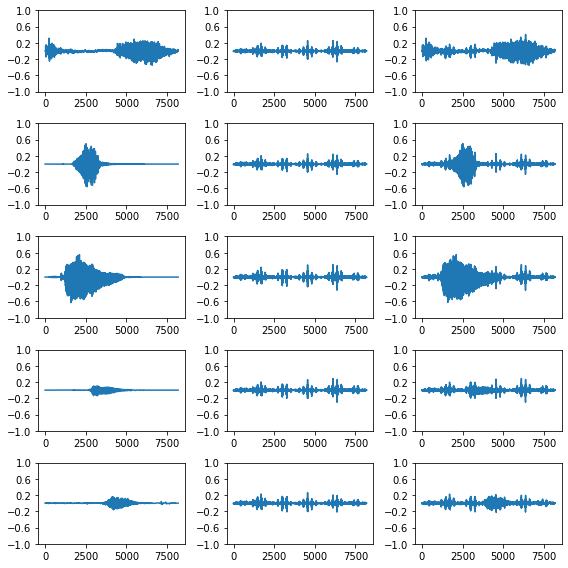

218/218 [==============================] - 104s 479ms/step - d_loss: 0.1987 - g_loss: 5.9787 - g_gan_loss: 2.8492 - g_adv_loss: 0.8304 - g_perturb_loss: 2.2991
Epoch 45/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 5.9955 - g_gan_loss: 2.8495 - g_adv_loss: 0.9072 - g_perturb_loss: 2.2388

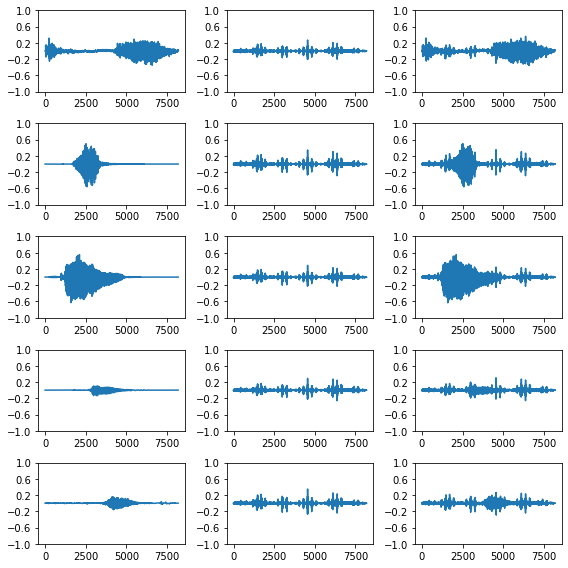

218/218 [==============================] - 104s 475ms/step - d_loss: 0.1987 - g_loss: 5.9906 - g_gan_loss: 2.8493 - g_adv_loss: 0.9030 - g_perturb_loss: 2.2383
Epoch 46/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1988 - g_loss: 5.8890 - g_gan_loss: 2.8496 - g_adv_loss: 0.8779 - g_perturb_loss: 2.1615

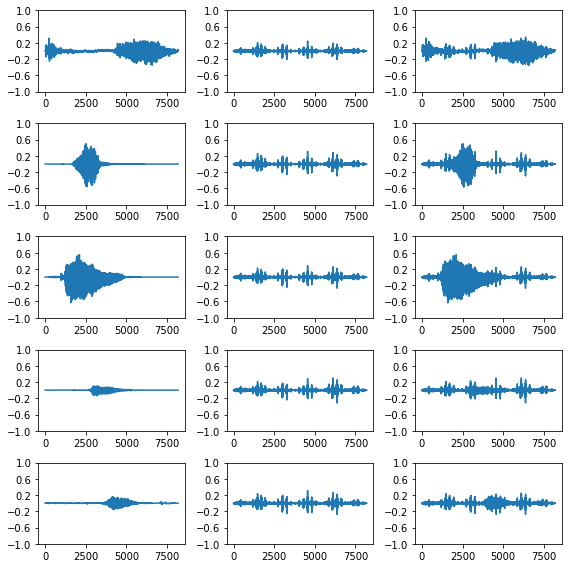

218/218 [==============================] - 105s 483ms/step - d_loss: 0.1988 - g_loss: 5.8849 - g_gan_loss: 2.8492 - g_adv_loss: 0.8738 - g_perturb_loss: 2.1618
Epoch 47/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 5.9906 - g_gan_loss: 2.8499 - g_adv_loss: 0.8160 - g_perturb_loss: 2.3248

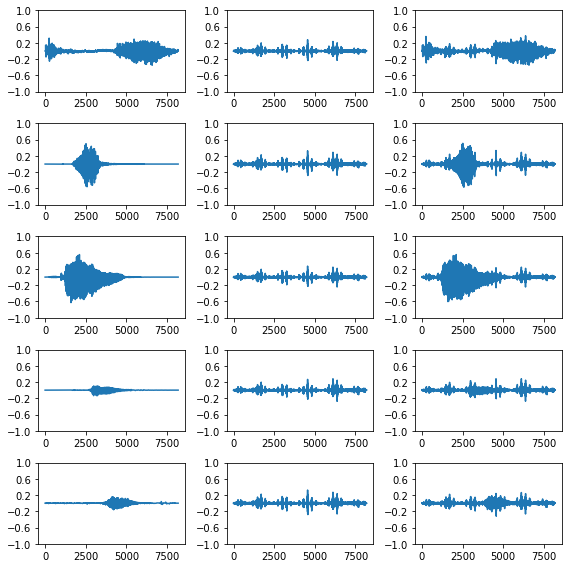

218/218 [==============================] - 106s 485ms/step - d_loss: 0.1987 - g_loss: 5.9862 - g_gan_loss: 2.8499 - g_adv_loss: 0.8122 - g_perturb_loss: 2.3241
Epoch 48/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 6.0555 - g_gan_loss: 2.8487 - g_adv_loss: 0.7924 - g_perturb_loss: 2.4144

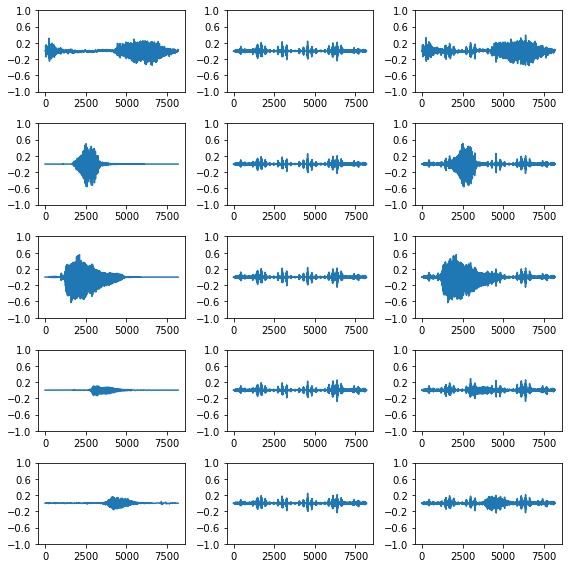

218/218 [==============================] - 106s 484ms/step - d_loss: 0.1986 - g_loss: 6.0503 - g_gan_loss: 2.8486 - g_adv_loss: 0.7888 - g_perturb_loss: 2.4130
Epoch 49/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1987 - g_loss: 5.9868 - g_gan_loss: 2.8491 - g_adv_loss: 0.7923 - g_perturb_loss: 2.3454

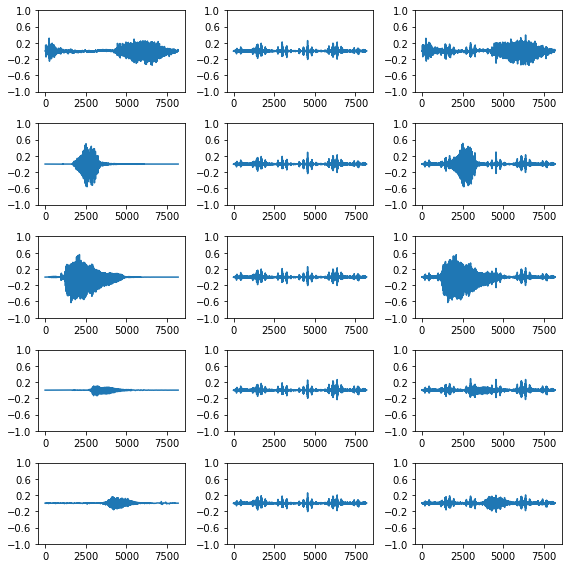

218/218 [==============================] - 106s 486ms/step - d_loss: 0.1987 - g_loss: 5.9819 - g_gan_loss: 2.8490 - g_adv_loss: 0.7887 - g_perturb_loss: 2.3442
Epoch 50/50
218/218 [==============================] - ETA: 0s - d_loss: 0.1986 - g_loss: 5.8799 - g_gan_loss: 2.8487 - g_adv_loss: 0.8473 - g_perturb_loss: 2.1840

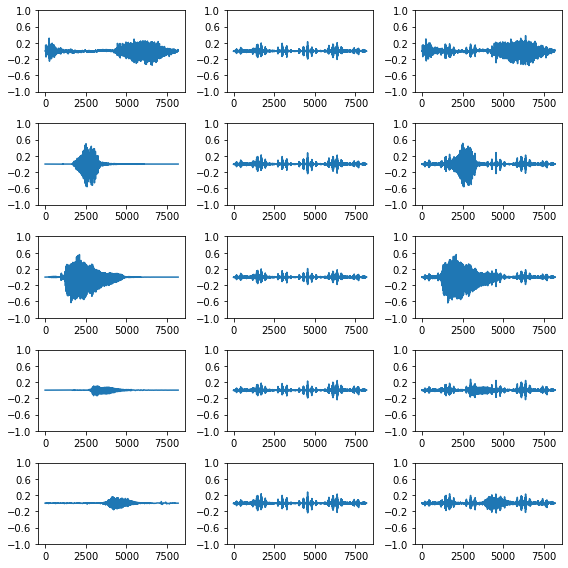

218/218 [==============================] - 104s 477ms/step - d_loss: 0.1986 - g_loss: 5.8761 - g_gan_loss: 2.8486 - g_adv_loss: 0.8434 - g_perturb_loss: 2.1841


In [ ]:
history = advgan.fit(
    dataset,
    epochs=50,
    callbacks=[monitor],
)

In [ ]:
weights_path = f'{WEIGHTS_DIR}/{BASE_FILENAME}_{time.strftime("%Y%m%d%H%M%S")}.h5'
advgan.save_weights(weights_path)

print(f'Weights saved as {weights_path}')

Weights saved as weights/advwavegan_sc_20220604154746.h5


In [ ]:
weights_path = f'{WEIGHTS_DIR}/{BASE_FILENAME}_g_{time.strftime("%Y%m%d%H%M%S")}.h5'
generator.save_weights(weights_path)

print(f'Weights saved as {weights_path}')

Weights saved as weights/advwavegan_sc_g_20220604154746.h5


Plot the generator and discriminator losses through the epochs:

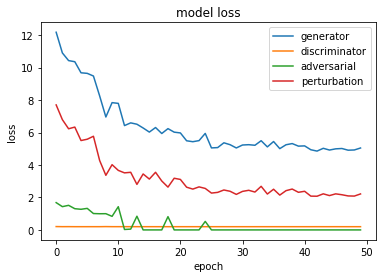

In [ ]:
plt.plot(history.history['g_loss'])
plt.plot(history.history['d_loss'])
plt.plot(history.history['g_adv_loss'])
plt.plot(history.history['g_perturb_loss'])

plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['generator', 'discriminator', 'adversarial', 'perturbation'], loc='best')

plt.show()

Plot the generator's progress through the epochs:


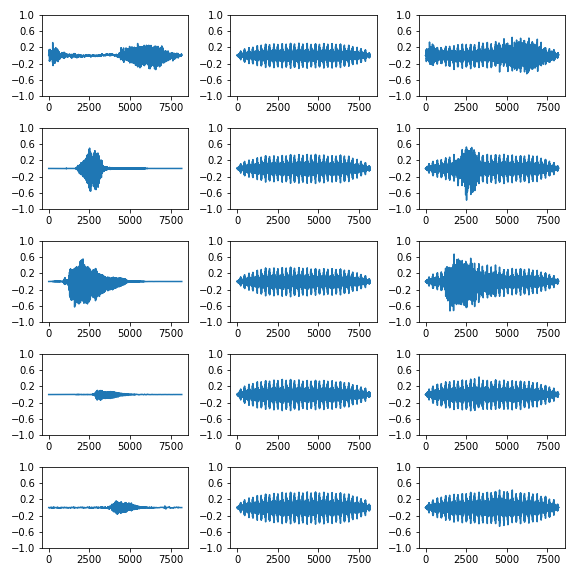

In [ ]:
import tensorflow_docs.vis.embed as embed

image_pattern = f'{AUDIO_DIR}/{BASE_FILENAME}*.png'
gif_path = f'{AUDIO_DIR}/{BASE_FILENAME}.gif'

images_to_gif(image_pattern, gif_path, delete_frames=True)
embed.embed_file(gif_path)

### Classifying generated audio using `SCConvTarget`

We'll test the generator's performance by classifying the adversarial audio it creates for the test set using the `MNISTConvTarget` model.

In [ ]:
test_audio = []
test_labels = []

for audio, label in test_data:
    test_audio.append(audio.numpy())
    test_labels.append(label.numpy())

test_audio = np.array(test_audio)
test_labels = np.array(test_labels)

In [ ]:
adv_audio, perturbations = generate_adv_examples(
    generator,
    test_audio,
    latent_dim=LATENT_DIM,
    perturb_bound=PERTURB_BOUND
)

In [ ]:
probs = target.predict(adv_audio)

In [ ]:
predictions = probs.argmax(axis=1)

Display and classify adversarial audio examples obtained for a sample of 5 audio examples:

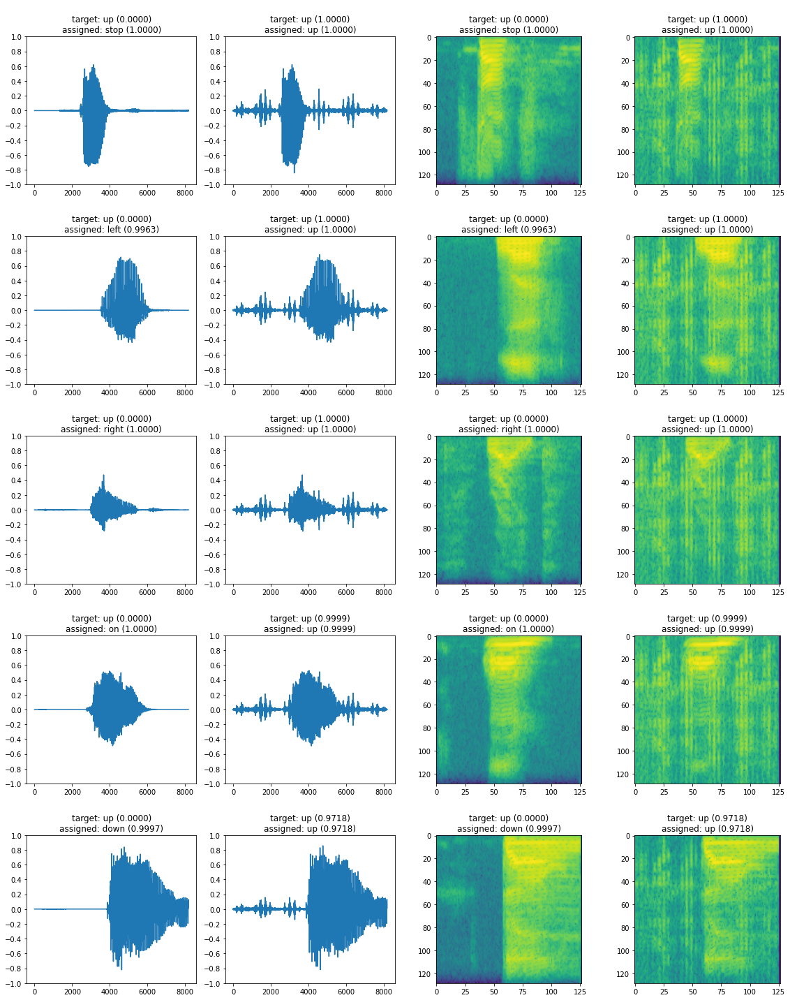

In [ ]:
plot_audio_results(
    test_audio[:5],
    adv_audio[:5],
    INPUT_SHAPE[0],
    target,
    TARGET_LABEL,
    label2idx=info.features['label'].str2int,
    idx2label=info.features['label'].int2str
)

#### Attack success rate

In [ ]:
target_idx = info.features['label'].names.index(TARGET_LABEL)

In [ ]:
asr = (predictions == target_idx).sum() / len(predictions)

print(f'Attack success rate: {asr * 100:.2f}%')

Attack success rate: 99.12%


#### Average probability of target prediction

In [ ]:
avg_prob = probs[:, target_idx].mean()

print(f'Average probability of predicting "{TARGET_LABEL}": {avg_prob:.4f}')

Average probability of predicting "up": 0.9898


#### Average perturbation strength ($L_2$-norm)

In [ ]:
reshaped = tf.reshape(perturbations, (tf.shape(perturbations)[0], -1))
avg_perturb_strength = tf.reduce_mean(tf.norm(reshaped, axis=1)).numpy()

print(f'Average perturbation strength: {avg_perturb_strength:.4f}')

Average perturbation strength: 2.3341


#### Attack confusion matrix

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:194: RuntimeWarning: invalid value encountered in true_divide


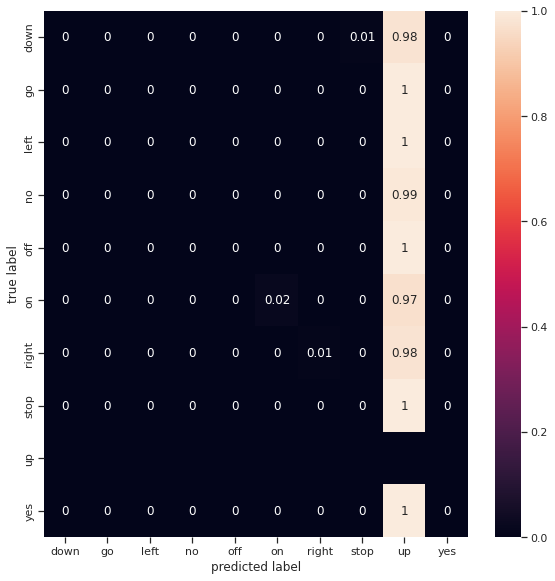

In [ ]:
plot_confusion_matrix(
    test_labels,
    predictions,
    classes=info.features['label'].names[:-2],
    ignore_idx=target_idx
)